### Start of EDA to try to figure out which features are of use to us from the files provided

In [4]:
# convert moodey to csv file not sure why I didn't before
import pandas as pd

# Load the Excel file
excel_file = 'moodey_files/combined_Moodey_data_merged.xlsx'

# Convert the first sheet into a CSV
df = pd.read_excel(excel_file)
df.to_csv('moodey_files/combined_Moodey_data_merged.csv', index=False)


In [5]:
import pandas as pd

# read files in
load_data = pd.read_csv('load_files/merged_load_data_verticalFormat_cleaned.csv')
weather_data_hourly = pd.read_csv('weather_files/merged_weather_data_verticalFormat_cleaned.csv')
weather_data_daily = pd.read_csv('weather_files/merged_weather_data_rain-daily.csv')
moodey_data = pd.read_csv('moodey_files/combined_Moodey_data_merged.csv')


C:\Users\jjack\AppData\Local\Temp\ipykernel_32764\395182784.py:7: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  moodey_data = pd.read_csv('moodey_files/combined_Moodey_data_merged.csv')


In [6]:
# seeing which columns have mixed types
# Check for columns with mixed types
for col in moodey_data.columns:
    unique_types = moodey_data[col].map(type).nunique()
    if unique_types > 1:
        print(f"Column '{col}' has mixed types with {unique_types} unique types.")

Column 'Res MF Permits' has mixed types with 2 unique types.


In [7]:
# Find and print the unique types in the column with mixed types
column_name = 'Res MF Permits'  # Replace with the column name you identified
unique_types = moodey_data[column_name].map(type).unique()

print(f"Unique types in column '{column_name}':")
for dtype in unique_types:
    print(dtype)


Unique types in column 'Res MF Permits':
<class 'str'>
<class 'float'>


In [8]:
# Find which ones are strings - should be only floats
string_values = moodey_data[moodey_data['Res MF Permits'].map(type) == str]['Res MF Permits']

print("String values in column 'Res MF Permits':")
print(string_values.unique())


String values in column 'Res MF Permits':
['1575.9137' '1324.3649' '1850.4351' ... '811.15715' '814.9455'
 '814.34148']


In [9]:
# Convert the 'Res MF Permits' column to floats
moodey_data['Res MF Permits'] = pd.to_numeric(moodey_data['Res MF Permits'], errors='coerce')

# double check
print(moodey_data['Res MF Permits'].dtype)


float64


### head() for each file 

In [12]:
print(load_data.head(5))
print()
print(weather_data_daily.head(5))
print()
print(weather_data_hourly.head(5))
print()
print(moodey_data.head(5))

           Dt  Hour  BasicLoad  BasicLoadNoSolar  SolarData
0  2000-01-01     1      193.0             193.0        0.0
1  2000-01-01     2      193.0             193.0        0.0
2  2000-01-01     3      184.0             184.0        0.0
3  2000-01-01     4      175.0             175.0        0.0
4  2000-01-01     5      172.0             172.0        0.0

           Dt  Rainfall  dbinRain      AvgDB  HDD55     HDD60     HDD65  \
0  2000-01-01   0.00500         1  65.441667    0.0  0.000000  0.000000   
1  2000-01-02   0.00125         1  65.688690    0.0  0.000000  0.000000   
2  2000-01-03   0.00125         1  65.799405    0.0  0.000000  0.000000   
3  2000-01-04   0.00125         1  69.077381    0.0  0.000000  0.000000   
4  2000-01-05   0.00000         0  58.308929    0.0  1.691071  6.691071   

      CDD65  CDD70  CDD75  
0  0.441667    0.0    0.0  
1  0.688690    0.0    0.0  
2  0.799405    0.0    0.0  
3  4.077381    0.0    0.0  
4  0.000000    0.0    0.0  

           Dt  Hour

In [15]:
# find unique dates in 'date' column
unique_dates = moodey_data['Date'].unique()

# Output the unique dates as a list
unique_dates_list = list(unique_dates)

# Sort the unique dates in chronological order
unique_dates_sorted = sorted(unique_dates_list, key=lambda x: pd.to_datetime(x))

print(unique_dates_sorted)


['2005-09-01', '2005-12-01', '2006-03-01', '2006-06-01', '2006-09-01', '2006-12-01', '2007-03-01', '2007-06-01', '2007-09-01', '2007-12-01', '2008-03-01', '2008-06-01', '2008-07-01', '2008-09-01', '2008-12-01', '2009-01-01', '2009-03-01', '2009-06-01', '2009-09-01', '2009-11-01', '2010-01-01', '2010-03-01', '2010-06-01', '2010-09-01', '2010-12-01', '2011-03-01', '2011-04-01', '2011-06-01', '2011-09-01', '2011-12-01', '2012-03-01', '2012-06-01', '2012-09-01', '2012-12-01', '2013-03-01', '2013-06-01', '2013-09-01', '2013-12-01', '2014-03-01', '2014-06-01', '2014-09-01', '2014-12-01', '2015-03-01', '2015-06-01', '2015-09-01', '2015-12-01', '2016-03-01', '2016-06-01', '2016-09-01', '2016-12-01', '2017-03-01', '2017-06-01', '2017-09-01', '2017-12-01', '2018-03-01', '2018-06-01', '2018-09-01', '2018-12-01', '2019-03-01', '2019-04-01', '2019-06-01', '2019-09-01', '2019-12-01', '2020-03-01', '2020-04-01', '2020-06-01', '2020-09-01', '2020-12-01', '2021-03-01', '2021-04-01', '2021-06-01', '2021

In [27]:
import pandas as pd
import os

# Define the output folder
output_folder = 'moodey_files/moodey_forecasts'
os.makedirs(output_folder, exist_ok=True)

# Iterate through unique dates and extract forecasts
for date in unique_dates_sorted:
    # Filter rows belonging to the current forecast
    forecast_df = moodey_data[moodey_data['Date'] == date]
    
    # Only include the header row once for the current forecast
    forecast_with_header = pd.DataFrame(columns=moodey_data.columns)
    forecast_with_header = pd.concat([forecast_with_header, forecast_df])

    # Format the date to mmm-yy
    formatted_date = pd.to_datetime(date).strftime('%b-%y')
    
    # Save to a CSV file
    output_path = os.path.join(output_folder, f'forecast_{formatted_date}.csv')
    forecast_with_header.to_csv(output_path, index=False)
    print(f"Saved: {output_path}")

print("\nAll forecasts have been saved to the 'moodey_forecasts' folder.")


Saved: moodey_files/moodey_forecasts\forecast_Sep-05.csv
Saved: moodey_files/moodey_forecasts\forecast_Dec-05.csv
Saved: moodey_files/moodey_forecasts\forecast_Mar-06.csv
Saved: moodey_files/moodey_forecasts\forecast_Jun-06.csv
Saved: moodey_files/moodey_forecasts\forecast_Sep-06.csv
Saved: moodey_files/moodey_forecasts\forecast_Dec-06.csv
Saved: moodey_files/moodey_forecasts\forecast_Mar-07.csv
Saved: moodey_files/moodey_forecasts\forecast_Jun-07.csv
Saved: moodey_files/moodey_forecasts\forecast_Sep-07.csv
Saved: moodey_files/moodey_forecasts\forecast_Dec-07.csv
Saved: moodey_files/moodey_forecasts\forecast_Mar-08.csv
Saved: moodey_files/moodey_forecasts\forecast_Jun-08.csv
Saved: moodey_files/moodey_forecasts\forecast_Jul-08.csv
Saved: moodey_files/moodey_forecasts\forecast_Sep-08.csv
Saved: moodey_files/moodey_forecasts\forecast_Dec-08.csv
Saved: moodey_files/moodey_forecasts\forecast_Jan-09.csv
Saved: moodey_files/moodey_forecasts\forecast_Mar-09.csv
Saved: moodey_files/moodey_fore

For some reason they have half the columns with April instead of March some years so going to merge those together for consistency

- checked contents of april files to see if they matched march of same year 
    - if so - delete april
- if not the same - merge april with march to complete the files since april had ~half the columns complete and march had the other half

In [28]:
import pandas as pd
import os

# Folder containing the forecast files
forecast_folder = "moodey_files/moodey_forecasts"

# List all files in the folder
all_files = os.listdir(forecast_folder)

# Separate March and April files
march_files = {file: pd.read_csv(os.path.join(forecast_folder, file)) for file in all_files if file.startswith("forecast_Mar")}
april_files = {file: pd.read_csv(os.path.join(forecast_folder, file)) for file in all_files if file.startswith("forecast_Apr")}

for april_file, april_data in april_files.items():
    year = april_file.split('-')[1][:2]  # Extract year from file name (e.g., '22' from 'Apr-22')
    march_file_name = f"forecast_Mar-{year}.csv"
    
    if march_file_name in march_files:
        # Load March data
        march_data = march_files[march_file_name]

        # Check if the values after the first 3 columns are identical
        if march_data.iloc[:, 3:].equals(april_data.iloc[:, 3:]):
            # If identical, remove the April file
            os.remove(os.path.join(forecast_folder, april_file))
            print(f"Removed identical April file: {april_file}")
        else:
            # If different, update the missing columns in March with values from April
            for column in april_data.columns[3:]:  # Skip the first 3 columns
                if column in march_data.columns:
                    # Fill missing values in March with values from April
                    march_data[column] = march_data[column].fillna(april_data[column])
                else:
                    # Add the column from April to March if it doesn't exist
                    march_data[column] = april_data[column]

            # Save the updated March file
            march_data.to_csv(os.path.join(forecast_folder, march_file_name), index=False)
            print(f"Merged April file into March file: {march_file_name}")
            
            # Remove the April file after merging
            os.remove(os.path.join(forecast_folder, april_file))
            print(f"Removed April file after merging: {april_file}")
    else:
        print(f"No corresponding March file found for: {april_file}")


Merged April file into March file: forecast_Mar-11.csv
Removed April file after merging: forecast_Apr-11.csv
Merged April file into March file: forecast_Mar-19.csv
Removed April file after merging: forecast_Apr-19.csv
Merged April file into March file: forecast_Mar-20.csv
Removed April file after merging: forecast_Apr-20.csv
Merged April file into March file: forecast_Mar-21.csv
Removed April file after merging: forecast_Apr-21.csv
Merged April file into March file: forecast_Mar-22.csv
Removed April file after merging: forecast_Apr-22.csv
Merged April file into March file: forecast_Mar-24.csv
Removed April file after merging: forecast_Apr-24.csv


One forecast has both november and september - keeping only september for consistency

In [29]:
# Treat November like April and September like March
# List all files again
november_files = {file: pd.read_csv(os.path.join(forecast_folder, file)) for file in all_files if file.startswith("forecast_Nov")}
september_files = {file: pd.read_csv(os.path.join(forecast_folder, file)) for file in all_files if file.startswith("forecast_Sep")}

for november_file, november_data in november_files.items():
    year = november_file.split('-')[1][:2]  # Extract year from file name (e.g., '22' from 'Nov-22')
    september_file_name = f"forecast_Sep-{year}.csv"
    
    if september_file_name in september_files:
        # Load September data
        september_data = september_files[september_file_name]

        # Check if the values after the first 3 columns are identical
        if september_data.iloc[:, 3:].equals(november_data.iloc[:, 3:]):
            # If identical, remove the November file
            os.remove(os.path.join(forecast_folder, november_file))
            print(f"Removed identical November file: {november_file}")
        else:
            # If different, update the missing columns in September with values from November
            for column in november_data.columns[3:]:  # Skip the first 3 columns
                if column in september_data.columns:
                    # Fill missing values in September with values from November
                    september_data[column] = september_data[column].fillna(november_data[column])
                else:
                    # Add the column from November to September if it doesn't exist
                    september_data[column] = november_data[column]

            # Save the updated September file
            september_data.to_csv(os.path.join(forecast_folder, september_file_name), index=False)
            print(f"Merged November file into September file: {september_file_name}")
            
            # Remove the November file after merging
            os.remove(os.path.join(forecast_folder, november_file))
            print(f"Removed November file after merging: {november_file}")
    else:
        print(f"No corresponding September file found for: {november_file}")


Merged November file into September file: forecast_Sep-09.csv
Removed November file after merging: forecast_Nov-09.csv


### MOODEY Files finally cleaned up now for the EDA

### Looking at Q4 data for every feature and every file from the moodey forecasts data

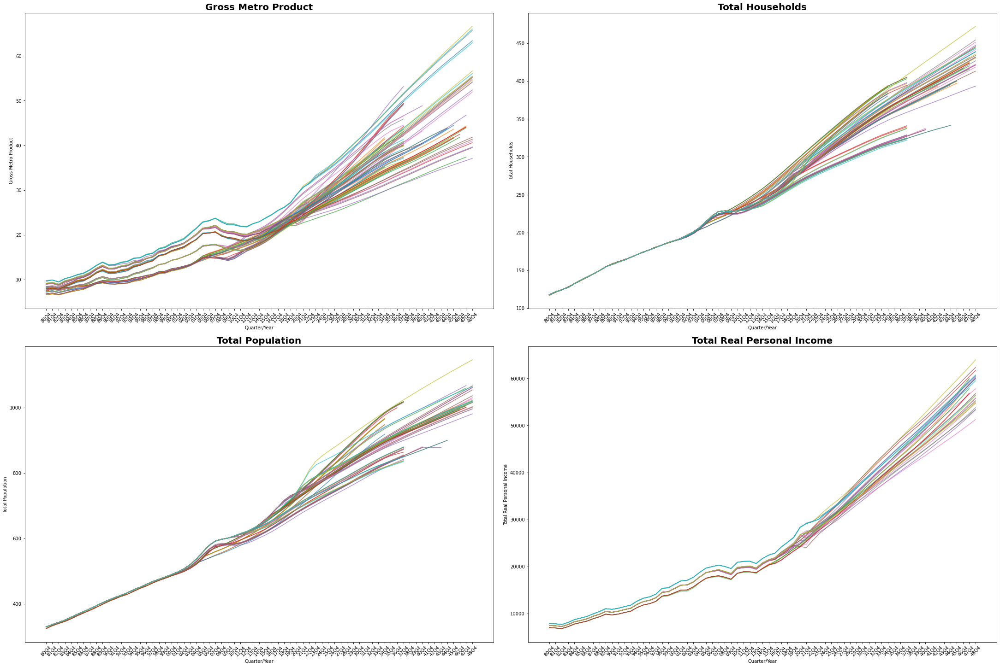

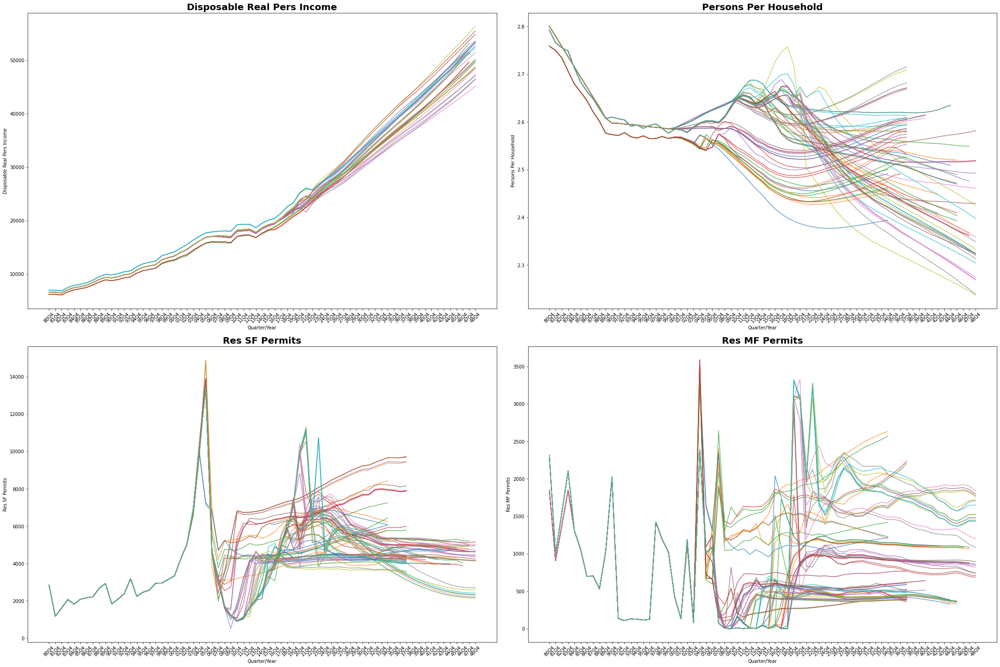

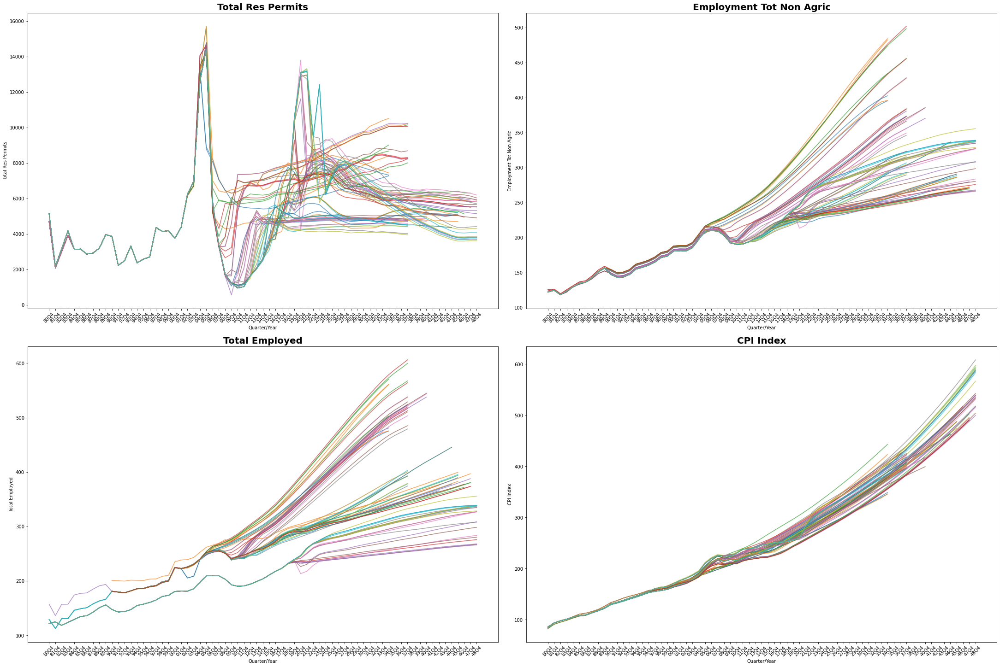

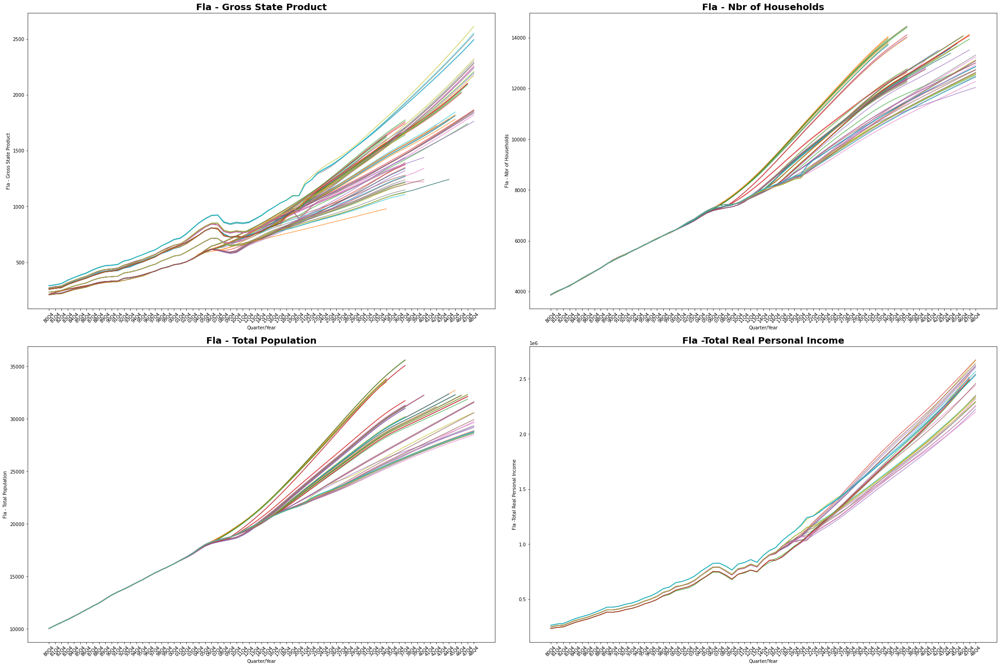

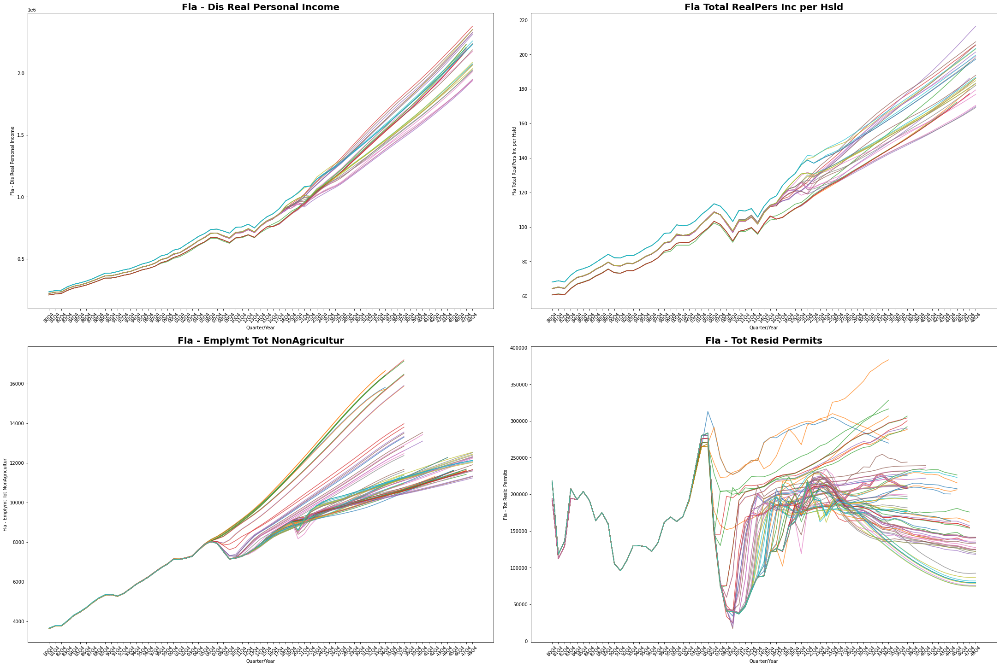

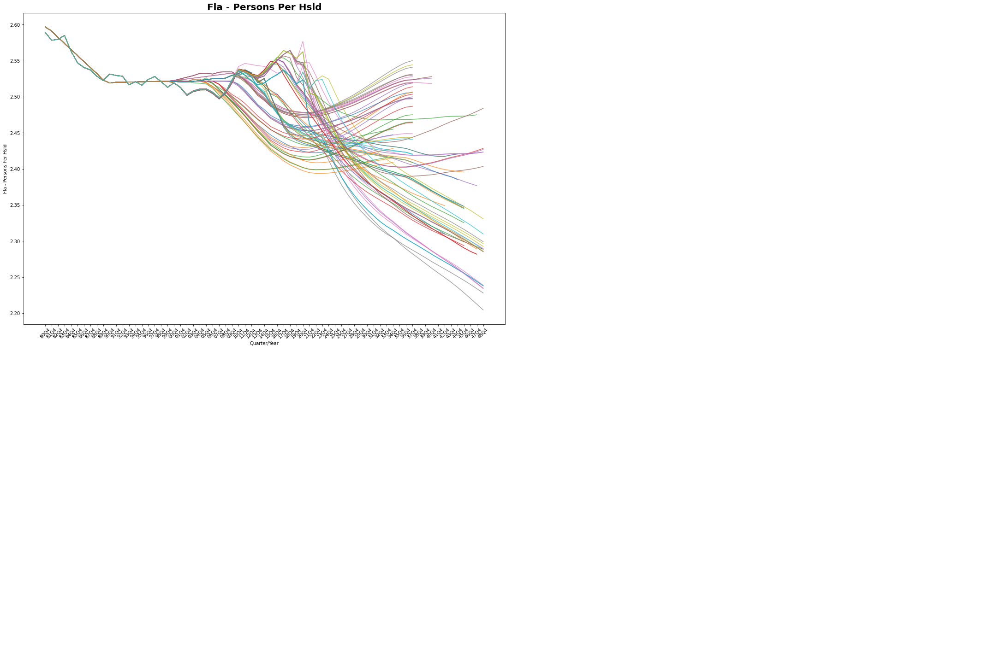

In [38]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Folder containing forecast files
forecast_folder = 'moodey_files/moodey_forecasts/'

# Load all forecast files into a dictionary
forecast_files = [f for f in os.listdir(forecast_folder) if f.endswith('.csv')]
forecast_data = {}

for file in forecast_files:
    forecast_date = file.split('_')[1].replace('.csv', '')  # Extract forecast date (e.g., Sep-05)
    df = pd.read_csv(os.path.join(forecast_folder, file))
    forecast_data[forecast_date] = df

# Extract consistent features
sample_df = list(forecast_data.values())[0]  # Use the first file as a reference
features = sample_df.columns[3:]  # Skip 'Year', 'Quarter/Year', 'Date' columns

# Filter for Q4 rows starting from 2015Q4
filtered_data = {}
for date, df in forecast_data.items():
    filtered_data[date] = df[(df['Quarter/Year'].str.endswith('Q4'))]

# Create a 2x2 grid of plots for each set of four features
n_features = len(features)
figures = []

for i in range(0, n_features, 4):
    feature_subset = features[i:i + 4]  # Get four features at a time

    # Initialize a 2x2 plot
    fig, axes = plt.subplots(2, 2, figsize=(30, 20), constrained_layout=True)
    axes = axes.flatten()  # Flatten for easy indexing

    for j, feature in enumerate(feature_subset):
        ax = axes[j]

        # Loop through forecasts and plot the feature
        for forecast_date, df in filtered_data.items():
            # Plot only Q4 data
            ax.plot(df['Quarter/Year'], df[feature], alpha=0.7)

        # Set larger and bold titles
        ax.set_title(feature, fontsize=20, weight='bold')
        ax.set_xlabel('Quarter/Year')
        ax.set_ylabel(feature)
        ax.tick_params(axis='x', rotation=45)

    # Hide unused subplots if < 4 features in the last set
    for k in range(len(feature_subset), 4):
        axes[k].axis('off')

    # Save figure for visualization in a non-scrollable grid
    figures.append(fig)

plt.show()



## Natural logs of variables:

In [1]:
import pandas as pd
import os
import numpy as np

# Folder containing forecast files
forecast_folder = 'moodey_files/moodey_forecasts/'

# Load all forecast files into a dictionary
forecast_files = [
    f for f in os.listdir(forecast_folder)
    if f.endswith('.csv') and int(f.split('_')[1].split('-')[1].replace('.csv', '')) >= 5  # Process all files
]

for file in forecast_files:
    # Extract forecast date (e.g., Sep-05)
    forecast_date = file.split('_')[1].replace('.csv', '')
    
    # Read the CSV file
    df = pd.read_csv(os.path.join(forecast_folder, file))
    
    # Create log-transformed columns (excluding first 3 columns)
    for col in df.columns[3:]:  # Skip 'Year', 'Quarter/Year', 'Date'
        df[f'ln_{col}'] = np.log(df[col].replace(0, np.nan))  # Replace 0 with NaN to avoid log(0) errors
    
    # Save the transformed data as a new file with "ln_" prefix
    output_filename = f'ln_{file}'
    output_path = os.path.join(forecast_folder, output_filename)
    df.to_csv(output_path, index=False)

    print(f"Saved: {output_path}")

print("\nAll forecasts with log-transformed variables have been saved.")


Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-05.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-06.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-07.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-08.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-10.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-11.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-12.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-13.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-14.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-15.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-16.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-17.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-18.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-19.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-20.csv
Saved: moodey_files/moodey_forecasts/ln_forecast_Dec-21.csv
Saved: moodey_files/moodey_forecasts/ln_

## Plot all the log data now

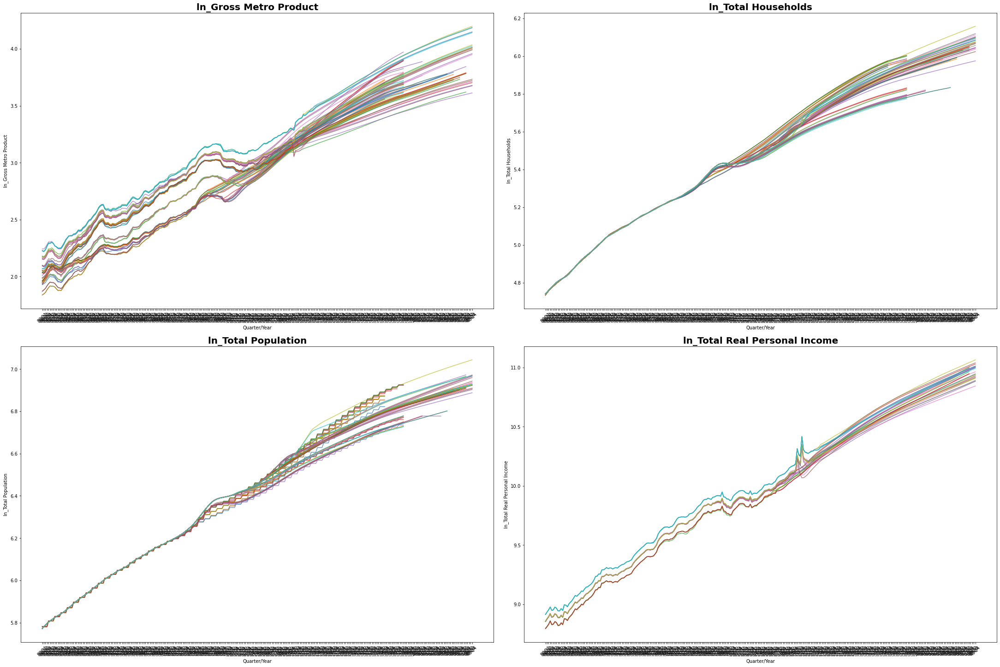

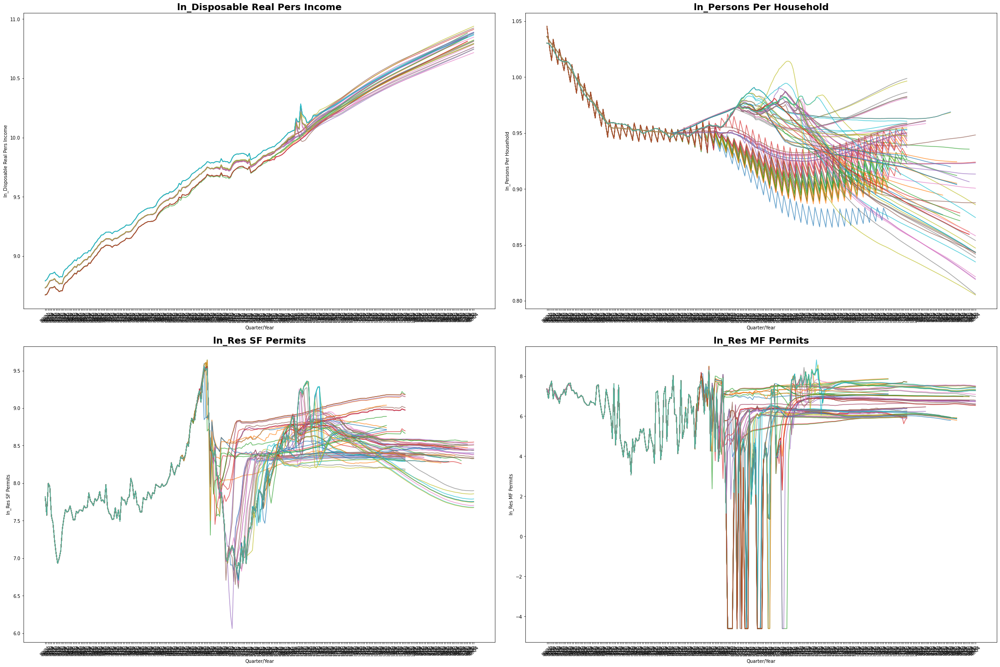

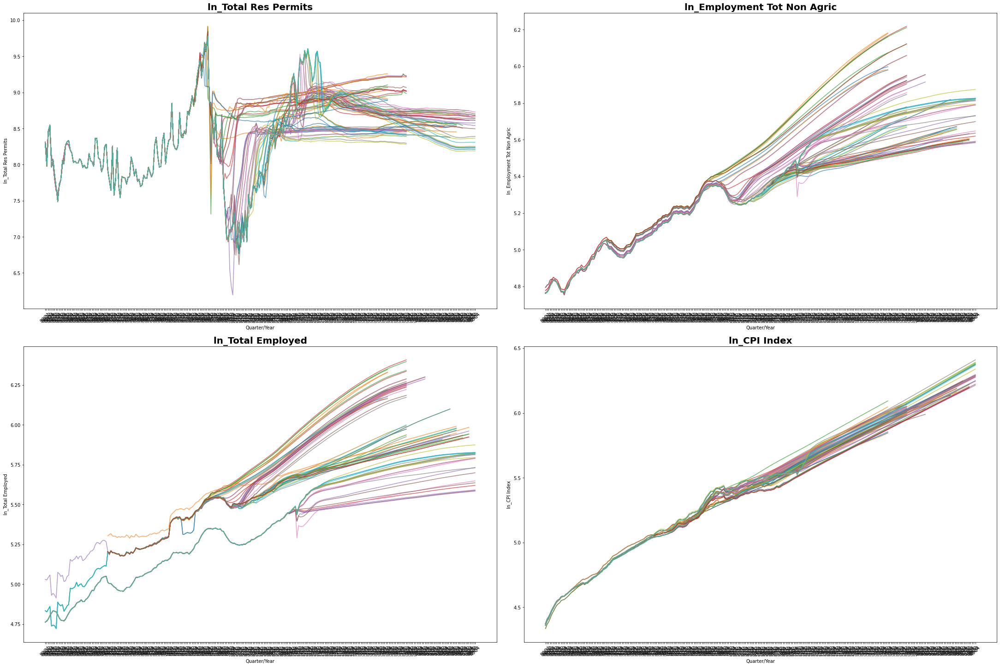

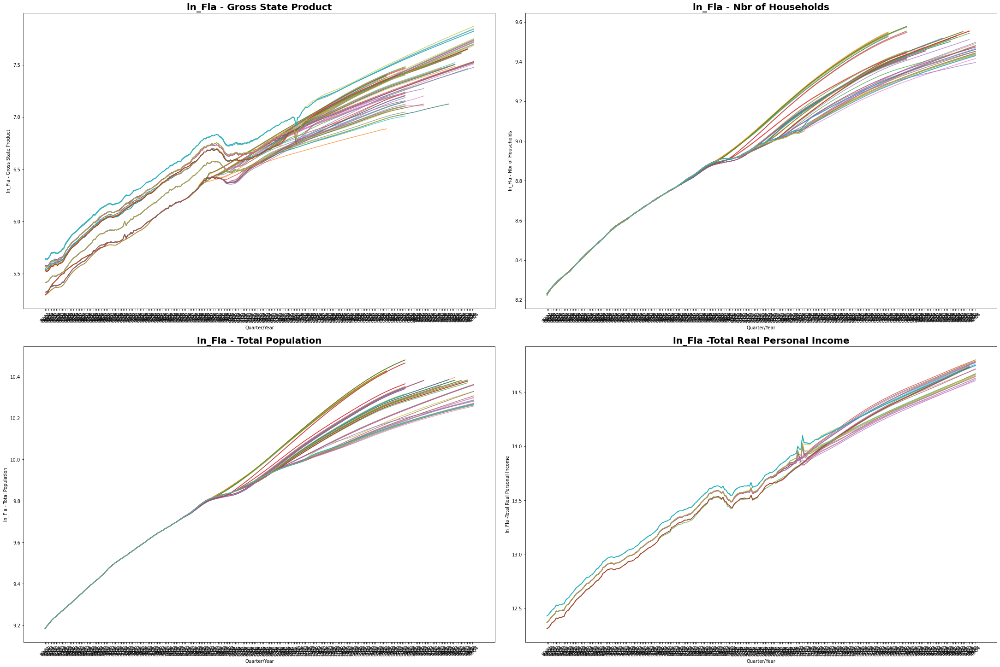

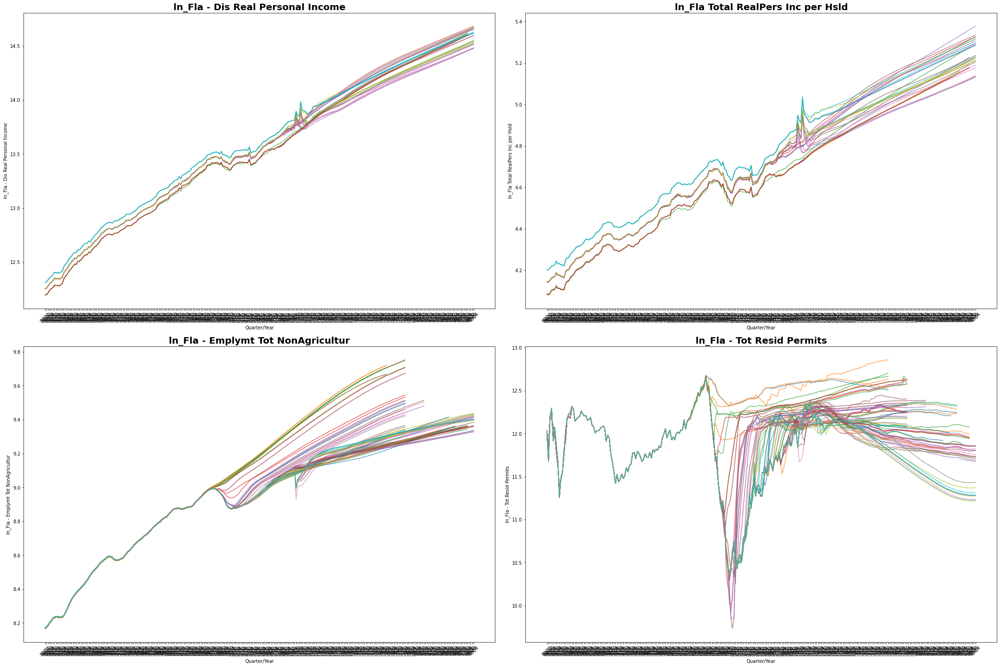

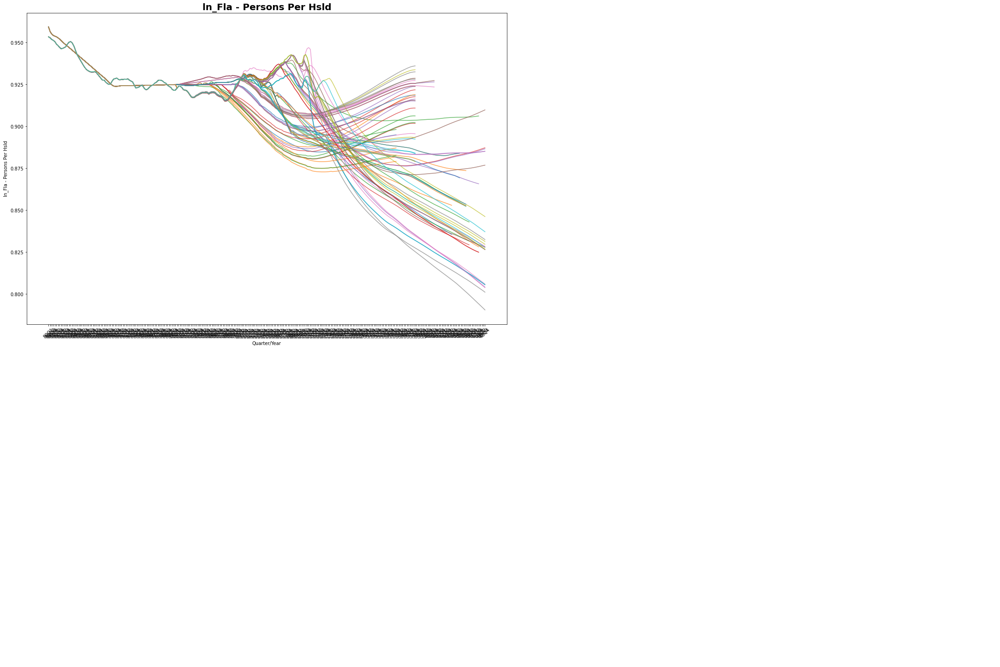

In [3]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Folder containing forecast files
forecast_folder = 'moodey_files/moodey_forecasts/'

# Load all forecast files into a dictionary
forecast_files = [
    f for f in os.listdir(forecast_folder)
    if f.endswith('.csv') and f.startswith('ln_')  # Process only log-transformed files
]

forecast_data = {}

for file in forecast_files:
    forecast_date = file.split('_')[2].replace('.csv', '')  # Extract forecast date (e.g., Sep-15)
    df = pd.read_csv(os.path.join(forecast_folder, file))
    forecast_data[forecast_date] = df

# Extract features that are log-transformed (starting with 'ln_')
sample_df = list(forecast_data.values())[0]  # Use the first file as a reference
features = [col for col in sample_df.columns if col.startswith('ln_')]  # Select only 'ln_' columns

# No filtering – Include ALL available data
filtered_data = forecast_data.copy()

# Create a 2x2 grid of plots for each set of four features
n_features = len(features)
figures = []

for i in range(0, n_features, 4):
    feature_subset = features[i:i + 4]  # Get four features at a time

    # Initialize a 2x2 plot
    fig, axes = plt.subplots(2, 2, figsize=(30, 20), constrained_layout=True)
    axes = axes.flatten()  # Flatten for easy indexing

    for j, feature in enumerate(feature_subset):
        ax = axes[j]

        # Loop through forecasts and plot the feature
        for forecast_date, df in filtered_data.items():
            ax.plot(df['Quarter/Year'], df[feature], alpha=0.7)

        # Set larger and bold titles
        ax.set_title(feature, fontsize=20, weight='bold')
        ax.set_xlabel('Quarter/Year')
        ax.set_ylabel(feature)
        ax.tick_params(axis='x', rotation=45)

    # Hide unused subplots if < 4 features in the last set
    for k in range(len(feature_subset), 4):
        axes[k].axis('off')

    # Save figure for visualization in a non-scrollable grid
    figures.append(fig)

plt.show()


## Plot of 2015-2035 - +/-  10 years

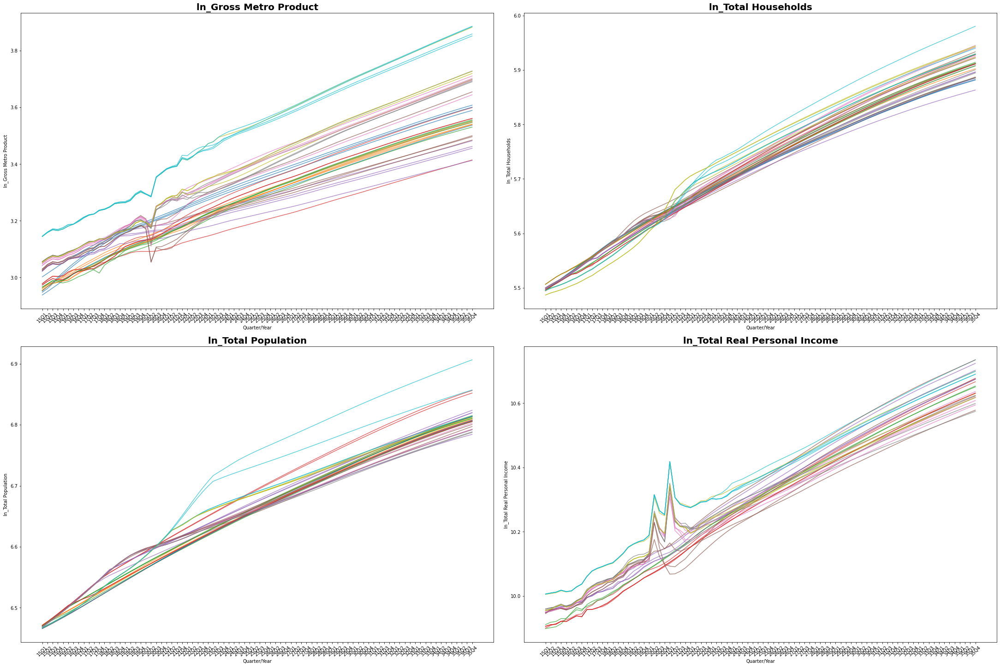

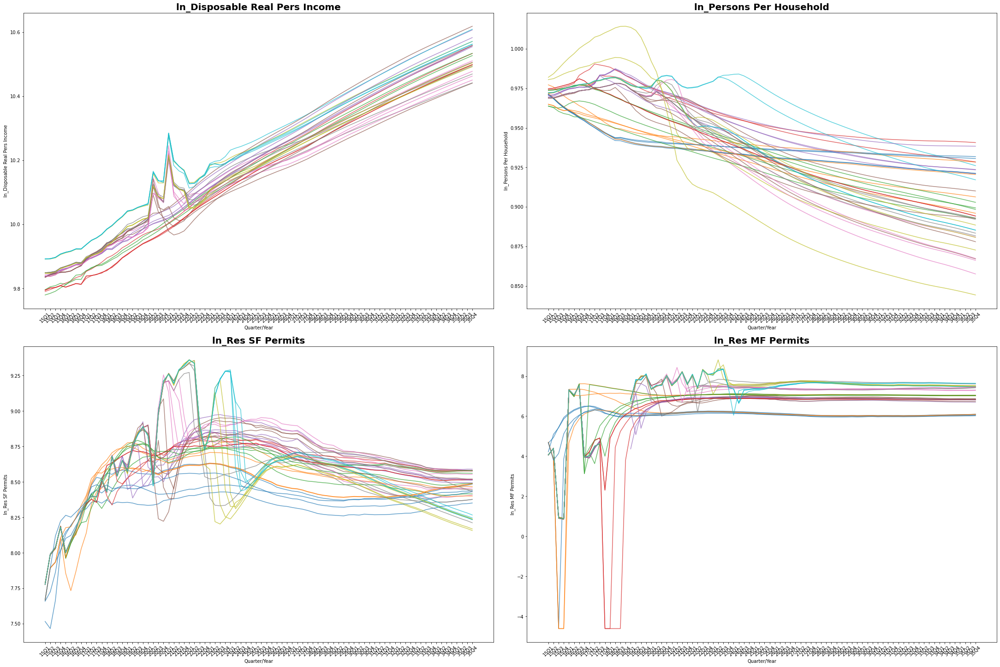

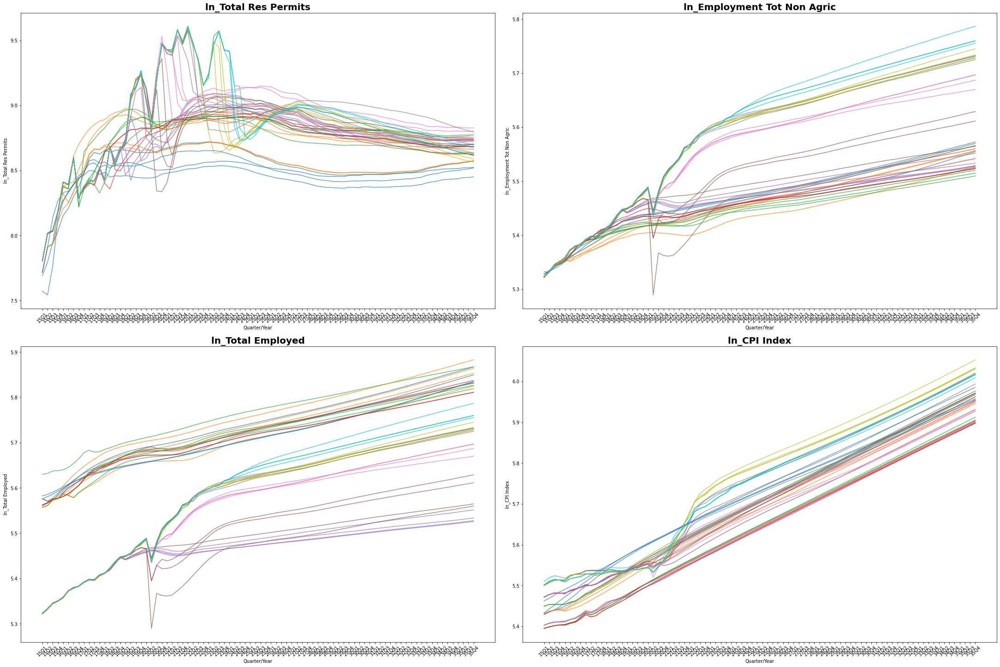

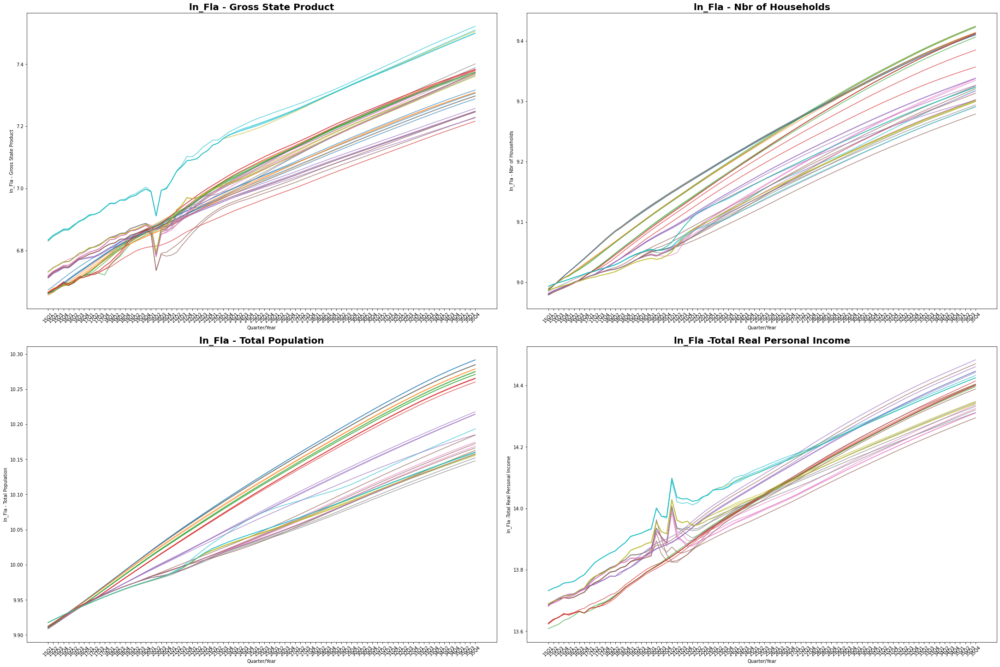

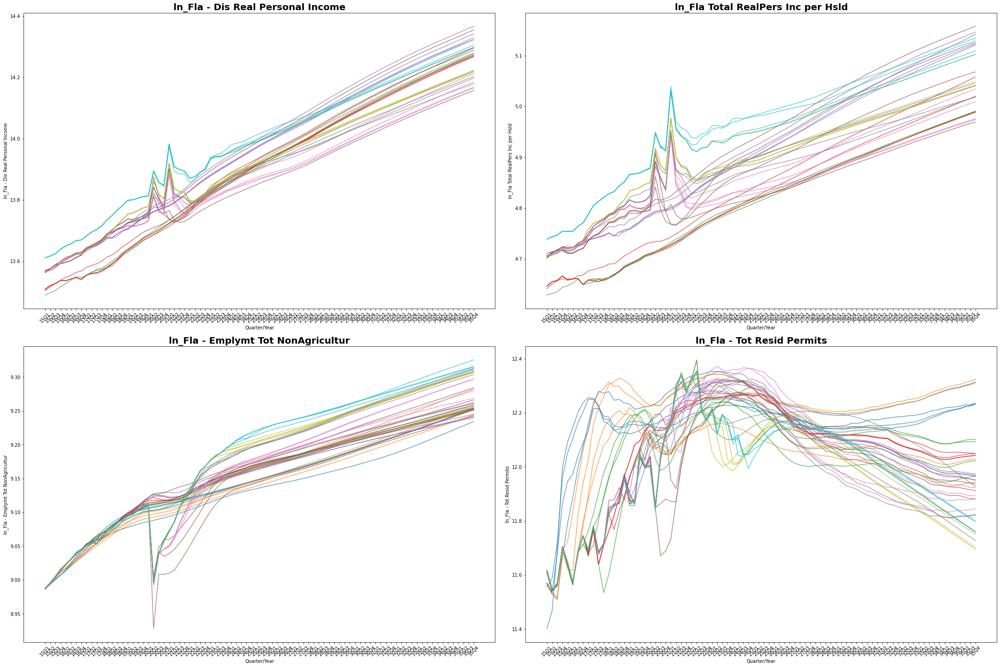

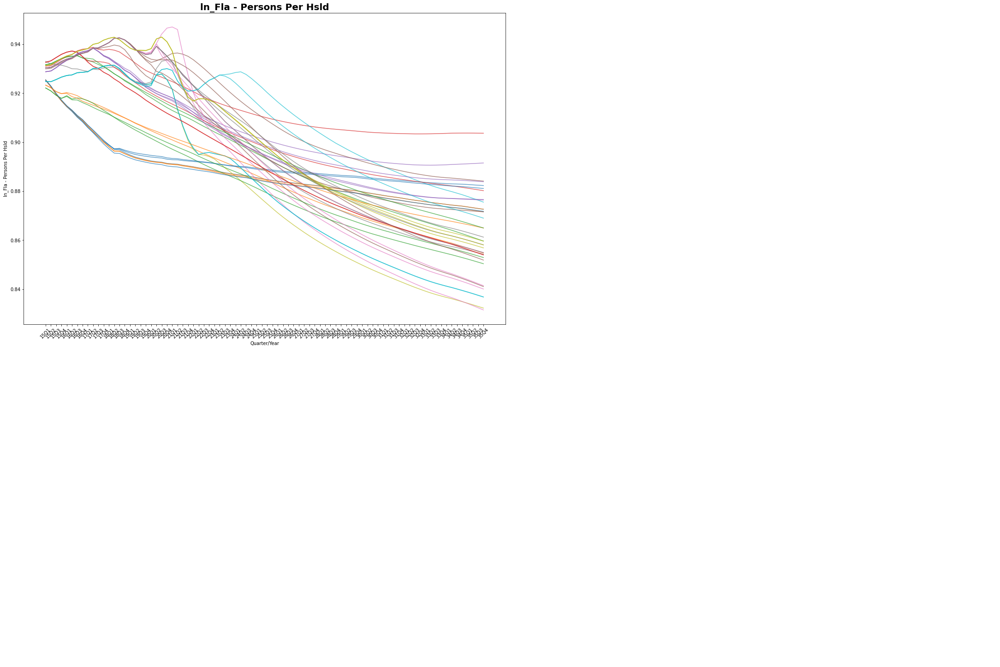

In [7]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Folder containing forecast files
forecast_folder = 'moodey_files/moodey_forecasts/'

# Load all forecast files into a dictionary
forecast_files = [
    f for f in os.listdir(forecast_folder)
    if f.endswith('.csv') and f.startswith('ln_') and int(f.split('_')[2].split('-')[1].replace('.csv', '')) >= 15
]  # Process only log-transformed files

forecast_data = {}

for file in forecast_files:
    forecast_date = file.split('_')[2].replace('.csv', '')  # Extract forecast date (e.g., Sep-15)
    df = pd.read_csv(os.path.join(forecast_folder, file))
    forecast_data[forecast_date] = df

# Extract features that are log-transformed (starting with 'ln_')
sample_df = list(forecast_data.values())[0]  # Use the first file as a reference
features = [col for col in sample_df.columns if col.startswith('ln_')]  # Select only 'ln_' columns

# Filter data for rows starting from 2015Q1 until 2036
filtered_data = {}
for date, df in forecast_data.items():
    filtered_data[date] = df[(df['Quarter/Year'] >= '15Q1') & (df['Quarter/Year'] < '36Q1')]

# Create a 2x2 grid of plots for each set of four features
n_features = len(features)
figures = []

for i in range(0, n_features, 4):
    feature_subset = features[i:i + 4]  # Get four features at a time

    # Initialize a 2x2 plot
    fig, axes = plt.subplots(2, 2, figsize=(30, 20), constrained_layout=True)
    axes = axes.flatten()  # Flatten for easy indexing

    for j, feature in enumerate(feature_subset):
        ax = axes[j]

        # Loop through forecasts and plot the feature
        for forecast_date, df in filtered_data.items():
            ax.plot(df['Quarter/Year'], df[feature], alpha=0.7)

        # Set larger and bold titles
        ax.set_title(feature, fontsize=20, weight='bold')
        ax.set_xlabel('Quarter/Year')
        ax.set_ylabel(feature)
        ax.tick_params(axis='x', rotation=45)

    # Hide unused subplots if < 4 features in the last set
    for k in range(len(feature_subset), 4):
        axes[k].axis('off')

    # Save figure for visualization in a non-scrollable grid
    figures.append(fig)

plt.show()


## Real Data obtained - SEE CITATION_INFO.xlsx

- merging real data - small dataset - manually combined household data since small datasets


CPI Data

In [16]:
import pandas as pd
import numpy as np

# Load the CSV file
file_path = 'real_economic_data/raw_data/CPI.csv' 
df = pd.read_csv(file_path)

# Convert 'Year' and 'Period' into 'Date' format YYYY-MM-DD
df['Date'] = df['Year'].astype(str) + '-' + df['Period'].str[1:].str.zfill(2) + '-01'

# Select and rename columns
df = df[['Date', 'Value']].rename(columns={'Value': 'CPI_value'})

# Compute the natural log of the CPI values
df['ln_CPI_value'] = np.log(df['CPI_value'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/cpi.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")


Processed data saved to: real_economic_data/processed_data/cpi.csv


Florida_gdp data

In [2]:
import pandas as pd
import numpy as np

# Load the CSV file while skipping unnecessary rows
file_path = 'real_economic_data/raw_data/Florida_gdp.csv'  # Adjust path if necessary
df = pd.read_csv(file_path, skiprows=3, header=None)  # Read without predefined headers

# Set the correct column names using the first row and drop it
df.columns = df.iloc[0]  
df = df[1:].reset_index(drop=True)

# Drop the first two columns (GeoFips and GeoName) before reshaping
df = df.iloc[:, 2:].copy()

# Convert to long format (fixing column selection)
df = df.melt(var_name='Date', value_name='Florida_gdp')

# Ensure numeric values for Florida_gdp
df['Florida_gdp'] = pd.to_numeric(df['Florida_gdp'], errors='coerce')

# Drop any rows with NaN values
df = df.dropna()

# Convert 'YYYY:QX' format to 'YYYY-MM-DD'
quarter_mapping = {
    'Q1': '-01-01',
    'Q2': '-04-01',
    'Q3': '-07-01',
    'Q4': '-10-01'
}

# Extract year and quarter, then map to correct date format
df['Date'] = df['Date'].str.replace(':', '-')  # Ensure proper format
df['Date'] = df['Date'].str[:4] + df['Date'].str[5:].map(quarter_mapping)  # Map quarters to correct month-day

# Divide the Florida_gdp values by 1000 to convert them to the same scale as the forecast data
df['Florida_gdp'] = df['Florida_gdp'] / 1000

# Compute the natural log of Florida GDP after scaling
df['ln_Florida_gdp'] = np.log(df['Florida_gdp'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/florida_gdp.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")


Processed data saved to: real_economic_data/processed_data/florida_gdp.csv


Florida Permits

In [18]:
import pandas as pd

# Define file path
file_path = 'real_economic_data/raw_data/Florida_permits.csv'  

# Load the CSV file
df = pd.read_csv(file_path)

# Rename the first column dynamically to 'Date'
df.columns.values[0] = 'Date'

# Rename columns
df = df.rename(columns={'FLBPPRIVSA': 'Total_permits_Florida'})

# Compute the natural log of the CPI values
df['ln_Total_permits_Florida'] = np.log(df['Total_permits_Florida'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/florida_total_permits.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")


Processed data saved to: real_economic_data/processed_data/florida_total_permits.csv


Florida Population - only found annual


In [19]:
import pandas as pd

# Define file path
file_path = 'real_economic_data/raw_data/Florida_population.csv'  

# Load the CSV file
df = pd.read_csv(file_path)

# Rename the first column dynamically to 'Date'
df.columns.values[0] = 'Date'

# Rename columns
df = df.rename(columns={'FLPOP': 'Total_population_Florida'})

# Compute the natural log of the CPI values
df['ln_Total_population_Florida'] = np.log(df['Total_population_Florida'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/florida_total_population.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")


Processed data saved to: real_economic_data/processed_data/florida_total_population.csv


florida total employment

In [27]:
import pandas as pd

# Define file path
file_path = 'real_economic_data/raw_data/florida_total_employment.csv'  

# Load the CSV file
df = pd.read_csv(file_path)

# Rename the first column dynamically to 'Date'
df.columns.values[0] = 'Date'

# Rename columns
df = df.rename(columns={'FLNA': 'Total_employment_Florida'})

# Compute the natural log of the CPI values
df['ln_Total_employment_Florida'] = np.log(df['Total_employment_Florida'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/florida_total_employment.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")

Processed data saved to: real_economic_data/processed_data/florida_total_employment.csv


gdp lakeland

In [ ]:
import pandas as pd
import numpy as np

# Load the CSV file while skipping unnecessary rows
file_path = 'real_economic_data/raw_data/gdp_lakeland.csv'  # Adjust path if necessary
df = pd.read_csv(file_path, skiprows=3, header=None)  # Read without predefined headers

# Set the correct column names using the first row and drop it
df.columns = df.iloc[0]
df = df[1:].reset_index(drop=True)

# Drop the first two columns (GeoFips and GeoName) before reshaping
df = df.iloc[:, 2:].copy()

# Convert to long format (fixing column selection)
df = df.melt(var_name='Date', value_name='Lakeland_gdp')

# Ensure numeric values for Lakeland_gdp
df['Lakeland_gdp'] = pd.to_numeric(df['Lakeland_gdp'], errors='coerce')

# Divide the Lakeland_gdp values by 1000000 to put them on the same scale as the forecast data
df['Lakeland_gdp'] = df['Lakeland_gdp'] / 1000000

# Drop any rows with NaN values
df = df.dropna()

# Convert Date column to YYYY-MM-DD format properly
df['Date'] = df['Date'].astype(int).astype(str) + '-01-01'  # Convert to int first, then string

# Compute the natural log of the Lakeland GDP values after scaling
df['ln_Lakeland_gdp'] = np.log(df['Lakeland_gdp'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/lakeland_gdp.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")


Processed data saved to: real_economic_data/processed_data/lakeland_gdp.csv


lakeland population

In [29]:
import pandas as pd

# Define file path
file_path = 'real_economic_data/raw_data/lakeland_population.csv'  

# Load the CSV file
df = pd.read_csv(file_path)

# Rename the first column dynamically to 'Date'
df.columns.values[0] = 'Date'

# Rename columns
df = df.rename(columns={'LWHPOP': 'Lakeland_population'})

# Compute the natural log of the CPI values
df['ln_Lakeland_population'] = np.log(df['Lakeland_population'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/lakeland_population.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")

Processed data saved to: real_economic_data/processed_data/lakeland_population.csv


lakeland total employees

In [30]:
import pandas as pd

# Define file path
file_path = 'real_economic_data/raw_data/lakeland_total_employees.csv'  

# Load the CSV file
df = pd.read_csv(file_path)

# Rename the first column dynamically to 'Date'
df.columns.values[0] = 'Date'

# Rename columns
df = df.rename(columns={'LAKE412NA': 'Lakeland_total_employees'})

# Compute the natural log of the CPI values
df['ln_Lakeland_total_employees'] = np.log(df['Lakeland_total_employees'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/lakeland_total_employees.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")

Processed data saved to: real_economic_data/processed_data/lakeland_total_employees.csv


Household data

In [6]:
import pandas as pd
import numpy as np

# Define file path
file_path = 'real_economic_data/raw_data/processed_household_data.csv'  # Adjust path if necessary

# Load the CSV file
df = pd.read_csv(file_path)

# Rename 'Year' to 'Date' and format as YYYY-01-01
df = df.rename(columns={'Year': 'Date'})
df['Date'] = df['Date'].astype(str) + '-01-01'  # Append fixed month and day

# Convert all other columns to numeric (excluding Date) and compute natural log
numeric_cols = df.columns[1:]  # Select all columns except 'Date'

for col in numeric_cols:
    df[col] = df[col].astype(str).str.replace(',', '')  # Remove commas from numbers
    df[col] = pd.to_numeric(df[col], errors='coerce')  # Convert to numeric
    
    # For specific columns, divide by 1000 before taking the log
    if col in ['Florida_Households', 'Polk_Households']:
        df[col] = df[col] / 1000
    
    df[f'ln_{col}'] = np.log(df[col])  # Compute natural log

# Save the cleaned data
output_path = 'real_economic_data/processed_data/processed_household_data.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")


Processed data saved to: real_economic_data/processed_data/processed_household_data.csv


real personal income Florida

In [32]:
import pandas as pd

# Load the CSV file while skipping unnecessary rows
file_path = 'real_economic_data/raw_data/real_personal_income_Florida.csv'  # Adjust path if necessary
df = pd.read_csv(file_path, skiprows=3, header=None)  # Read without predefined headers

# Set the correct column names using the first row and drop it
df.columns = df.iloc[0]  
df = df[1:].reset_index(drop=True)

# Drop the first two columns (GeoFips and GeoName) before reshaping
df = df.iloc[:, 2:].copy()

# Convert to long format (fixing column selection)
df = df.melt(var_name='Date', value_name='Real_personal_income_Florida')

# Ensure numeric values for Florida_gdp
df['Real_personal_income_Florida'] = pd.to_numeric(df['Real_personal_income_Florida'], errors='coerce')

# Drop any rows with NaN values
df = df.dropna()

# Convert Date column to YYYY-MM-DD format properly
df['Date'] = df['Date'].astype(int).astype(str) + '-01-01'  # Convert to int first, then string

# Compute the natural log of the CPI values
df['ln_Real_personal_income_Florida'] = np.log(df['Real_personal_income_Florida'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/real_personal_income_Florida.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")


Processed data saved to: real_economic_data/processed_data/real_personal_income_Florida.csv


real personal income lakeland

In [1]:
import pandas as pd
import numpy as np

# Load the CSV file while skipping unnecessary rows
file_path = 'real_economic_data/raw_data/real_personal_income_Lakeland.csv'  # Adjust path if necessary
df = pd.read_csv(file_path, skiprows=3, header=None)  # Read without predefined headers

# Set the correct column names using the first row and drop it
df.columns = df.iloc[0]
df = df[1:].reset_index(drop=True)

# Drop the first two columns (GeoFips and GeoName) before reshaping
df = df.iloc[:, 2:].copy()

# Convert to long format
df = df.melt(var_name='Date', value_name='Real_personal_income_Lakeland')

# Ensure numeric values for Real_personal_income_Lakeland
df['Real_personal_income_Lakeland'] = pd.to_numeric(df['Real_personal_income_Lakeland'], errors='coerce')

# Divide the values by 1000 to match the forecast scale (millions)
df['Real_personal_income_Lakeland'] = df['Real_personal_income_Lakeland'] / 1000

# Drop any rows with NaN values
df = df.dropna()

# Convert Date column to YYYY-MM-DD format properly
df['Date'] = df['Date'].astype(int).astype(str) + '-01-01'

# Compute the natural log of the real personal income values
df['ln_Real_personal_income_Lakeland'] = np.log(df['Real_personal_income_Lakeland'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/real_personal_income_Lakeland.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")


Processed data saved to: real_economic_data/processed_data/real_personal_income_Lakeland.csv


SF permits florida

In [34]:
import pandas as pd

# Define file path
file_path = 'real_economic_data/raw_data/SF_permits_FL.csv'  

# Load the CSV file
df = pd.read_csv(file_path)

# Rename the first column dynamically to 'Date'
df.columns.values[0] = 'Date'

# Rename columns
df = df.rename(columns={'FLBP1FHSA': 'SF_permits_Florida'})

# Compute the natural log of the CPI values
df['ln_SF_permits_Florida'] = np.log(df['SF_permits_Florida'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/sf_permits_FL.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")

Processed data saved to: real_economic_data/processed_data/sf_permits_FL.csv


sf permits lakeland


In [35]:
import pandas as pd

# Define file path
file_path = 'real_economic_data/raw_data/SF_permits_Lakeland.csv'  

# Load the CSV file
df = pd.read_csv(file_path)

# Rename the first column dynamically to 'Date'
df.columns.values[0] = 'Date'

# Rename columns
df = df.rename(columns={'LAKE412BP1FHSA': 'SF_permits_Lakeland'})

# Compute the natural log of the CPI values
df['ln_SF_permits_Lakeland'] = np.log(df['SF_permits_Lakeland'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/sf_permits_Lakeland.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")

Processed data saved to: real_economic_data/processed_data/sf_permits_Lakeland.csv


total permits lakeland

In [36]:
import pandas as pd

# Define file path
file_path = 'real_economic_data/raw_data/total_permits_Lakeland.csv'  

# Load the CSV file
df = pd.read_csv(file_path)

# Rename the first column dynamically to 'Date'
df.columns.values[0] = 'Date'

# Rename columns
df = df.rename(columns={'LAKE412BPPRIVSA': 'Total_permits_Lakeland'})

# Compute the natural log of the CPI values
df['ln_Total_permits_Lakeland'] = np.log(df['Total_permits_Lakeland'])

# Save the cleaned data
output_path = 'real_economic_data/processed_data/total_permits_Lakeland.csv'
df.to_csv(output_path, index=False)

print(f"Processed data saved to: {output_path}")

Processed data saved to: real_economic_data/processed_data/total_permits_Lakeland.csv


- plot forecasts from 2000 onwards and then plot the real data on top

## VARIABLES KEEPING
- have real data and plots aren't a giant mess for the forecast data

- cpi, florida_gdp, florida_total_employment, florida_total_population, real_personal_income_Florida
- lakeland_gdp, lakeland_population, lakeland_total_employees, real_personal_income_Lakeland
- processed_household_data (contains number of households and average household size)



## NOT USING

- any permit data


## Plot a variable with the moody data
### Gross Metro Product - Lakeland

✅ Sample Forecast Data:
    Quarter/Year  Gross Metro Product
3          80Q4              6.56802
7          81Q4              6.78155
11         82Q4              6.53956
15         83Q4              6.93000
19         84Q4              7.25815
✅ Sample Real GDP Data:
   Quarter/Year        GDP
0         01Q4  18.457509
1         02Q4  19.076837
2         03Q4  19.702588
3         04Q4  20.689807
4         05Q4  21.881068


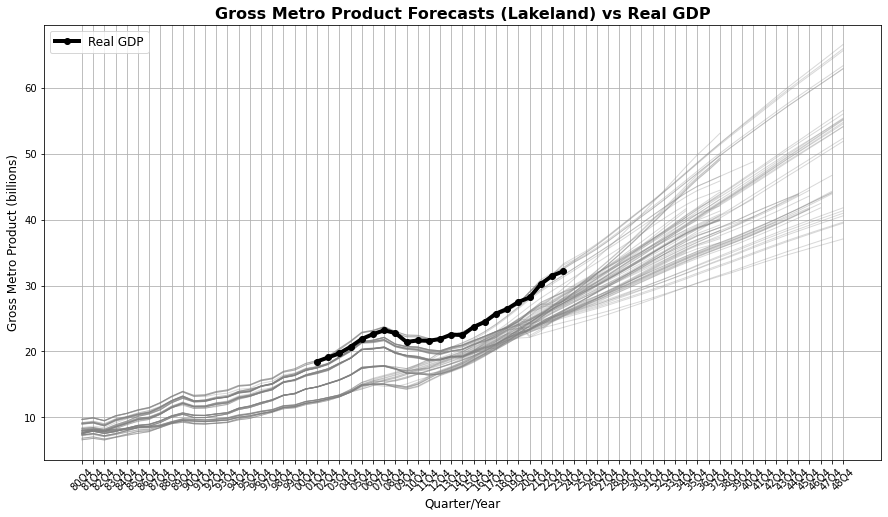

In [31]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Folder containing forecast files
forecast_folder = 'moodey_files/moodey_forecasts/'

# Load all forecast files into a dictionary
forecast_files = [f for f in os.listdir(forecast_folder) if f.endswith('.csv')]
forecast_data = {}

for file in forecast_files:
    forecast_date = file.split('_')[1].replace('.csv', '')  # Extract forecast date (e.g., Sep-05)
    df = pd.read_csv(os.path.join(forecast_folder, file))

    # Ensure 'Gross Metro Product' exists in the dataset
    if 'Gross Metro Product' in df.columns and 'Quarter/Year' in df.columns:
        # Convert Quarter/Year to string to prevent mismatches
        df['Quarter/Year'] = df['Quarter/Year'].astype(str)
        forecast_data[forecast_date] = df[df['Quarter/Year'].str.endswith('Q4')][['Quarter/Year', 'Gross Metro Product']]

# Debug: Ensure forecast data loaded correctly
if not forecast_data:
    print("❌ No forecast data loaded! Check file paths and column names.")
else:
    sample_forecast = list(forecast_data.values())[0]  # First forecast dataset
    print("✅ Sample Forecast Data:\n", sample_forecast.head())

# Load real GDP data
real_data_file = 'real_economic_data/processed_data/lakeland_gdp.csv'
real_gdp_df = pd.read_csv(real_data_file)

# Convert 'Date' column to datetime format
real_gdp_df['Date'] = pd.to_datetime(real_gdp_df['Date'])

# Convert Year to `YYQ4` format (matching forecast data)
real_gdp_df['Quarter/Year'] = real_gdp_df['Date'].dt.strftime('%y') + 'Q4'

# Keep only relevant columns and rename GDP column
real_gdp_df = real_gdp_df[['Quarter/Year', 'Lakeland_gdp']].rename(columns={'Lakeland_gdp': 'GDP'})

# Debug: Check real GDP formatting
print("✅ Sample Real GDP Data:\n", real_gdp_df.head())

# Ensure sorting for correct plotting
real_gdp_df = real_gdp_df.sort_values(by="Quarter/Year")

# Start Plot
plt.figure(figsize=(15, 8))

# Plot forecasted data in **faded gray**
for forecast_date, df in forecast_data.items():
    plt.plot(df['Quarter/Year'], df['Gross Metro Product'], color='gray', alpha=0.3, linewidth=1, label='_nolegend_')  # Keep forecasts gray

# **Plot real GDP in solid black on top**
plt.plot(real_gdp_df['Quarter/Year'], real_gdp_df['GDP'], 
         marker='o', color='black', linewidth=4, label='Real GDP', zorder=3)

# Formatting
plt.title('Gross Metro Product Forecasts (Lakeland) vs Real GDP', fontsize=16, weight='bold')
plt.xlabel('Quarter/Year', fontsize=12)
plt.ylabel('Gross Metro Product (billions)', fontsize=12)
plt.xticks(rotation=45)

# **Ensure only "Real GDP" appears in the legend**
plt.legend(['Real GDP'], loc='upper left', fontsize=12)

plt.grid(True)

# Show the plot
plt.show()



### Lakeland Population

✅ Sample Forecast Data:
    Quarter/Year  Total Population
3          80Q4         324.07529
7          81Q4         332.98300
11         82Q4         339.93399
15         83Q4         346.08401
19         84Q4         354.41501
✅ Sample Real Population Data:
   Quarter/Year  Population
0         00Q4     485.378
1         01Q4     491.393
2         02Q4     498.428
3         03Q4     508.118
4         04Q4     521.029


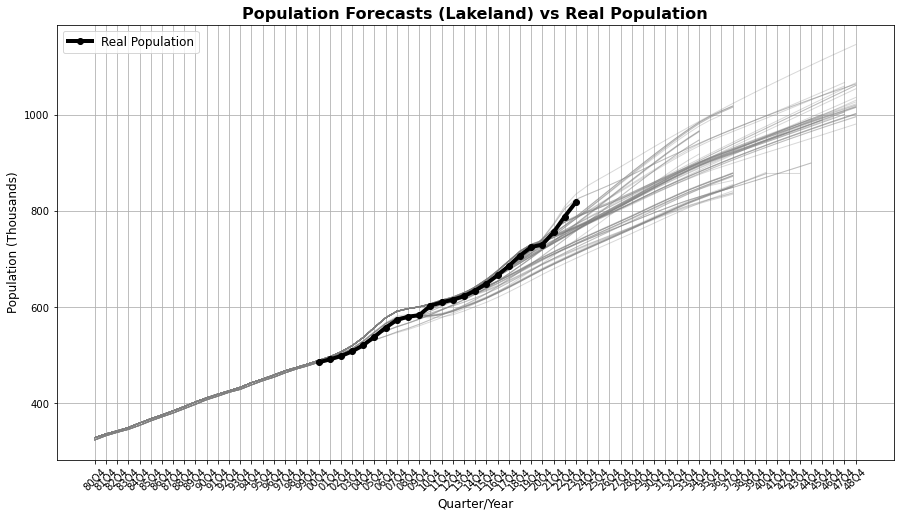

In [30]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Folder containing forecast files
forecast_folder = 'moodey_files/moodey_forecasts/'

# Load all forecast files into a dictionary
forecast_files = [f for f in os.listdir(forecast_folder) if f.endswith('.csv')]
forecast_data = {}

for file in forecast_files:
    forecast_date = file.split('_')[1].replace('.csv', '')  # Extract forecast date (e.g., Sep-05)
    df = pd.read_csv(os.path.join(forecast_folder, file))

    # Ensure 'Total Population' exists in the dataset
    if 'Total Population' in df.columns and 'Quarter/Year' in df.columns:
        # Convert Quarter/Year to string to prevent mismatches
        df['Quarter/Year'] = df['Quarter/Year'].astype(str)
        forecast_data[forecast_date] = df[df['Quarter/Year'].str.endswith('Q4')][['Quarter/Year', 'Total Population']]

# Debug: Ensure forecast data loaded correctly
if not forecast_data:
    print("❌ No forecast data loaded! Check file paths and column names.")
else:
    sample_forecast = list(forecast_data.values())[0]  # First forecast dataset
    print("✅ Sample Forecast Data:\n", sample_forecast.head())

# Load real Population data
real_data_file = 'real_economic_data/processed_data/lakeland_population.csv'
real_population_df = pd.read_csv(real_data_file)

# Convert 'Date' column to datetime format
real_population_df['Date'] = pd.to_datetime(real_population_df['Date'])

# Convert Year to `YYQ4` format (matching forecast data)
real_population_df['Quarter/Year'] = real_population_df['Date'].dt.strftime('%y') + 'Q4'

# Keep only relevant columns and rename Population column
real_population_df = real_population_df[['Quarter/Year', 'Lakeland_population']].rename(columns={'Lakeland_population': 'Population'})

# Debug: Check real Population formatting
print("✅ Sample Real Population Data:\n", real_population_df.head())

# Ensure sorting for correct plotting
real_population_df = real_population_df.sort_values(by="Quarter/Year")

# Start Plot
plt.figure(figsize=(15, 8))

# Plot forecasted Population in **faded gray**
for forecast_date, df in forecast_data.items():
    plt.plot(df['Quarter/Year'], df['Total Population'], color='gray', alpha=0.3, linewidth=1, label='_nolegend_')  # Keep forecasts gray

# **Plot real Population in solid black on top**
plt.plot(real_population_df['Quarter/Year'], real_population_df['Population'], 
         marker='o', color='black', linewidth=4, label='Real Population', zorder=3)

# Formatting
plt.title('Population Forecasts (Lakeland) vs Real Population', fontsize=16, weight='bold')
plt.xlabel('Quarter/Year', fontsize=12)
plt.ylabel('Population (Thousands)', fontsize=12)
plt.xticks(rotation=45)

# **Ensure only "Real Population" appears in the legend**
plt.legend(['Real Population'], loc='upper left', fontsize=12)

plt.grid(True)

# Show the plot
plt.show()

